In [143]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

In [144]:
class Topsis():
    evaluation_matrix = np.array([])  # Matrix
    weighted_normalized = np.array([])  # Weight matrix
    normalized_decision = np.array([])  # Normalisation matrix
    M = 0  # Number of rows
    N = 0  # Number of columns

    '''
	Create an evaluation matrix consisting of m alternatives and n criteria,
	with the intersection of each alternative and criteria given as {\displaystyle x_{ij}}x_{ij},
	we therefore have a matrix {\displaystyle (x_{ij})_{m\times n}}(x_{{ij}})_{{m\times n}}.
	'''

    def __init__(self, evaluation_matrix, weight_matrix, criteria):
        # M×N matrix
        self.evaluation_matrix = np.array(evaluation_matrix, dtype="float")

        # M alternatives (options)
        self.row_size = len(self.evaluation_matrix)

        # N attributes/criteria
        self.column_size = len(self.evaluation_matrix[0])

        # N size weight matrix
        self.weight_matrix = np.array(weight_matrix, dtype="float")
        self.weight_matrix = self.weight_matrix/sum(self.weight_matrix)
        self.criteria = np.array(criteria, dtype="float")

    '''
	# Step 2
	The matrix {\displaystyle (x_{ij})_{m\times n}}(x_{{ij}})_{{m\times n}} is then normalised to form the matrix
	'''

    def step_2(self):
        # normalized scores
        self.normalized_decision = np.copy(self.evaluation_matrix)
        sqrd_sum = np.zeros(self.column_size)
        for i in range(self.row_size):
            for j in range(self.column_size):
                sqrd_sum[j] += self.evaluation_matrix[i, j]**2
        for i in range(self.row_size):
            for j in range(self.column_size):
                self.normalized_decision[i,
                                         j] = self.evaluation_matrix[i, j]/(sqrd_sum[j]**0.5)

    '''
	# Step 3
	Calculate the weighted normalised decision matrix
	'''

    def step_3(self):
        self.weighted_normalized = np.copy(self.normalized_decision)
        for i in range(self.row_size):
            for j in range(self.column_size):
                self.weighted_normalized[i, j] *= self.weight_matrix[j]

    '''
	# Step 4
	Determine the worst alternative {\displaystyle (A_{w})}(A_{w}) and the best alternative {\displaystyle (A_{b})}(A_{b}):
	'''

    def step_4(self):
        self.worst_alternatives = np.zeros(self.column_size)
        self.best_alternatives = np.zeros(self.column_size)
        for i in range(self.column_size):
            if self.criteria[i]:
                self.worst_alternatives[i] = min(
                    self.weighted_normalized[:, i])
                self.best_alternatives[i] = max(self.weighted_normalized[:, i])
            else:
                self.worst_alternatives[i] = max(
                    self.weighted_normalized[:, i])
                self.best_alternatives[i] = min(self.weighted_normalized[:, i])

    '''
	# Step 5
	Calculate the L2-distance between the target alternative {\displaystyle i}i and the worst condition {\displaystyle A_{w}}A_{w}
	{\displaystyle d_{iw}={\sqrt {\sum _{j=1}^{n}(t_{ij}-t_{wj})^{2}}},\quad i=1,2,\ldots ,m,}
	and the distance between the alternative {\displaystyle i}i and the best condition {\displaystyle A_{b}}A_b
	{\displaystyle d_{ib}={\sqrt {\sum _{j=1}^{n}(t_{ij}-t_{bj})^{2}}},\quad i=1,2,\ldots ,m}
	where {\displaystyle d_{iw}}d_{{iw}} and {\displaystyle d_{ib}}d_{{ib}} are L2-norm distances 
	from the target alternative {\displaystyle i}i to the worst and best conditions, respectively.
	'''

    def step_5(self):
        self.worst_distance = np.zeros(self.row_size)
        self.best_distance = np.zeros(self.row_size)

        self.worst_distance_mat = np.copy(self.weighted_normalized)
        self.best_distance_mat = np.copy(self.weighted_normalized)

        for i in range(self.row_size):
            for j in range(self.column_size):
                self.worst_distance_mat[i][j] = (self.weighted_normalized[i][j]-self.worst_alternatives[j])**2
                self.best_distance_mat[i][j] = (self.weighted_normalized[i][j]-self.best_alternatives[j])**2
                
                self.worst_distance[i] += self.worst_distance_mat[i][j]
                self.best_distance[i] += self.best_distance_mat[i][j]

        for i in range(self.row_size):
            self.worst_distance[i] = self.worst_distance[i]**0.5
            self.best_distance[i] = self.best_distance[i]**0.5

    '''
	# Step 6
	Calculate the similarity
	'''

    def step_6(self):
        np.seterr(all='ignore')
        self.worst_similarity = np.zeros(self.row_size)
        self.best_similarity = np.zeros(self.row_size)

        for i in range(self.row_size):
            # calculate the similarity to the worst condition
            self.worst_similarity[i] = self.worst_distance[i] / \
                (self.worst_distance[i]+self.best_distance[i])

            # calculate the similarity to the best condition
            self.best_similarity[i] = self.best_distance[i] / \
                (self.worst_distance[i]+self.best_distance[i])
    
    def ranking(self, data):
        return [i+1 for i in data.argsort()]

    def rank_to_worst_similarity(self):
        # return rankdata(self.worst_similarity, method="min").astype(int)
        return self.ranking(self.worst_similarity)

    def rank_to_best_similarity(self):
        # return rankdata(self.best_similarity, method='min').astype(int)
        return self.ranking(self.best_similarity)
    
    @property
    def s_plus(self):
        # расстояние до лучшей альтерантивы
        return self.best_similarity
    
    @property
    def s_minus(self):
        # расстояние до худщей альтернативы
        return self.worst_similarity

    def calc(self):
        # print("Step 1\n", self.evaluation_matrix, end="\n\n")
        self.step_2()
        # print("Step 2\n", self.normalized_decision, end="\n\n")
        self.step_3()
        # print("Step 3\n", self.weighted_normalized, end="\n\n")
        self.step_4()
        # print("Step 4\n", self.worst_alternatives,
        #      self.best_alternatives, end="\n\n")
        self.step_5()
        # print("Step 5\n", self.worst_distance, self.best_distance, end="\n\n")
        self.step_6()
        # print("Step 6\n", self.worst_similarity,
        #       self.best_similarity, end="\n\n")

In [145]:
df = pd.read_csv('reports_info_esg2.csv', index_col=0)
df.head()

,компания,сектор,год,тип отчета,ссылка на отчет,E_Общие,E_Биоразнообразие,E_Вода,E_Газ,E_Климат,...,S_Охрана здоровья,S_Профсоюзы и коллективные договоры,S_Трудовые отношения,G_Антикоррупция,G_Дивиденды и акционеры,G_Инновации,G_Лидерство,G_Отчетность и прозрачность,G_Управление рисками,G_Эффективность и производительность
1,"ОАО ""МРСК Урала""",Энергетика,2021,ИО,/download/af503e07dd6b861d1ed3048c36868cc9/,0.02,0.01,0.0,0.0,0.02,...,0.0,0.02,0.05,0.02,0.06,0.01,0.08,0.05,0.03,0.05
2,"ПАО ""Россети Сибирь""",Энергетика,2021,ИО,/download/57becde4be827f45bedf2a46f58d793a/,0.01,0.01,0.0,0.0,0.02,...,0.0,0.02,0.03,0.01,0.05,0.01,0.07,0.04,0.02,0.03
3,"ПАО ""Россети Юг""",Энергетика,2021,ИО,/download/851fbaea09387885cefa38bd3b6838f3/,0.01,0.01,0.0,0.0,0.01,...,0.0,0.01,0.03,0.01,0.05,0.01,0.06,0.03,0.02,0.03
4,ПАО «Россети Ленэнерго»,Энергетика,2021,ИО,/download/2034b8c8e84e4bba78049bdd976fc122/,0.02,0.01,0.0,0.0,0.02,...,0.0,0.02,0.04,0.02,0.05,0.01,0.06,0.04,0.02,0.04
5,ПАО «Россети Кубань»,Энергетика,2021,ИО,/download/9462e171afc761c3f098fce4f993e2a8/,0.02,0.01,0.0,0.0,0.02,...,0.0,0.02,0.04,0.02,0.06,0.01,0.07,0.05,0.03,0.05


In [146]:
df = df[df['год'].apply(len) == 4]
df.shape

(1101, 32)

In [147]:
df_year_grouped = df.groupby('год')
for year, df_group in df_year_grouped:
    evaluation_matrix_e = df_group[['E_Биоразнообразие', 'E_Вода', 'E_Газ', 
                                    'E_Климат', 'E_Отходы', 'E_Экологический менеджмент',
                                    'E_Энергия', 'E_Общие']].to_numpy()
    evaluation_matrix_s = df_group[['S_Безопасность и охрана здоровья', 'S_Безопасность продукта',
                                    'S_Благотворительность', 'S_Инвестиции и капитальные вложения',
                                    'S_Налоги', 'S_Обучение и развитие', 'S_Оплата труда',
                                    'S_Отношения с потребителями', 'S_Отношения с работниками',
                                    'S_Охрана здоровья', 'S_Профсоюзы и коллективные договоры',
                                    'S_Трудовые отношения']].to_numpy()
    evaluation_matrix_g = df_group[['G_Антикоррупция', 'G_Дивиденды и акционеры',
                                    'G_Инновации', 'G_Лидерство', 'G_Отчетность и прозрачность',
                                    'G_Управление рисками', 'G_Эффективность и производительность']].to_numpy()
    
    weights_e = np.ones(evaluation_matrix_e.shape[1])
    criterias_e = np.ones(evaluation_matrix_e.shape[1])
    
    weights_s = np.ones(evaluation_matrix_s.shape[1])
    criterias_s = np.ones(evaluation_matrix_s.shape[1])
    
    weights_g = np.ones(evaluation_matrix_g.shape[1])
    criterias_g = np.ones(evaluation_matrix_g.shape[1])
    
    t_e = Topsis(evaluation_matrix_e, weights_e, criterias_e)
    t_s = Topsis(evaluation_matrix_s, weights_s, criterias_s)
    t_g = Topsis(evaluation_matrix_g, weights_g, criterias_g)
    
    t_e.calc()
    t_s.calc()
    t_g.calc()
    
    
    df.loc[df['год'] == year, 'E_s+'] = t_e.s_plus
    df.loc[df['год'] == year, 'E_s-'] = t_e.s_minus
    
    df.loc[df['год'] == year, 'S_s+'] = t_s.s_plus
    df.loc[df['год'] == year, 'S_s-'] = t_s.s_minus
           
    df.loc[df['год'] == year, 'G_s+'] = t_g.s_plus
    df.loc[df['год'] == year, 'G_s-'] = t_g.s_minus

In [148]:
# s+ - расстояние до лучшей альтернативы
# s- - расстояние до худшей альтернативы
df[['компания', 'год', 'E_s+',  'E_s-', 'S_s+', 'S_s-', 'G_s+', 'G_s-']].head()

,компания,год,E_s+,E_s-,S_s+,S_s-,G_s+,G_s-
1,"ОАО ""МРСК Урала""",2021,0.827309,0.172691,0.678109,0.321891,0.502425,0.497575
2,"ПАО ""Россети Сибирь""",2021,0.831927,0.168073,0.757968,0.242032,0.606275,0.393725
3,"ПАО ""Россети Юг""",2021,0.864562,0.135438,0.789615,0.210385,0.632732,0.367268
4,ПАО «Россети Ленэнерго»,2021,0.732607,0.267393,0.723276,0.276724,0.585860,0.414140
5,ПАО «Россети Кубань»,2021,0.811106,0.188894,0.622085,0.377915,0.513417,0.486583


In [149]:
df_repeats = df.groupby('компания').count()
df_repeats = df_repeats[df_repeats['год'] > 1]
df_repeats.shape

(153, 37)

In [150]:
df_repeats = df[df['компания'].isin(df_repeats.index)]
df_repeats.shape

(1047, 38)

In [151]:
df_repeats['компания'].unique().shape

(153,)

In [152]:
def param_in_different_years(company_name, df, ax, param):
    ax.scatter(df['год'].astype(int), df[param].astype(float))
    ax.set_xlabel('год')
    ax.set_ylabel(param)
    ax.set_title(company_name)

In [153]:
df['E_s-'].describe()

count    1101.000000
mean        0.212968
std         0.135207
min         0.000000
25%         0.124887
50%         0.183716
75%         0.267217
max         1.000000
Name: E_s-, dtype: float64

In [154]:
fig, axs = plt.subplots(153, 1, figsize=(20, 153*3))
plt.subplots_adjust(hspace=0.5)
for ax, (company_name, company_df) in zip(axs, 
                                          df_repeats.groupby('компания')):
    ax.set_xlim(2003, 2022)
    ax.set_ylim(-0.15, 1)
    param_in_different_years(company_name, company_df, ax, 'E_s-')

In [155]:
df['S_s-'].describe()

count    1098.000000
mean        0.253213
std         0.114996
min         0.000000
25%         0.169172
50%         0.243307
75%         0.322266
max         0.677351
Name: S_s-, dtype: float64

In [156]:
fig, axs = plt.subplots(153, 1, figsize=(20, 153*3))
plt.subplots_adjust(hspace=0.5)
for ax, (company_name, company_df) in zip(axs, 
                                          df_repeats.groupby('компания')):
    ax.set_xlim(2003, 2022)
    ax.set_ylim(-0.15, 1)
    param_in_different_years(company_name, company_df, ax, 'S_s-')

In [157]:
df['G_s-'].describe()

count    1101.000000
mean        0.321140
std         0.137720
min         0.000000
25%         0.225035
50%         0.313154
75%         0.411353
max         0.921462
Name: G_s-, dtype: float64

In [158]:
fig, axs = plt.subplots(153, 1, figsize=(20, 153*3))
plt.subplots_adjust(hspace=0.5)
for ax, (company_name, company_df) in zip(axs, 
                                          df_repeats.groupby('компания')):
    ax.set_xlim(2003, 2022)
    ax.set_ylim(-0.15, 1)
    param_in_different_years(company_name, company_df, ax, 'G_s-')

In [159]:
df['год'].astype(int).describe()

count    1101.000000
mean     2014.749319
std         4.594148
min      2003.000000
25%      2011.000000
50%      2016.000000
75%      2019.000000
max      2021.000000
Name: год, dtype: float64

In [160]:
df_2021 = df[df['год'] == '2021']
df_2021.shape

(88, 38)

In [161]:
df_2021_repeats = df_2021.groupby('компания').count()
df_2021_repeats.shape

(83, 37)

In [162]:
df_2021['компания'].unique()

array(['ОАО "МРСК Урала"', 'ПАО "Россети Сибирь"', 'ПАО "Россети Юг"',
       'ПАО «Россети Ленэнерго»', 'ПАО «Россети Кубань»',
       'ПАО "Россети Волга"', 'ПАО «Распадская»',
       'ПАО "Метафракс Кемикалс"', 'БФ Спина бифида', 'ОАО «КРАСЦВЕТМЕТ»',
       'Брусника', 'АО НК «КазМунайГаз»', 'АО «ИНК-Капитал»',
       'АО «Атомэнергопром»', 'VK', 'ROS AGRO PLC', 'Etalon Group',
       'ПАО "ЭсЭфАй"', 'ПАО "ЯТЭК"', 'En+ Group ', 'EVRAZ PLC', 'GV Gold',
       'Segezha Group', 'X5 Retail Group', 'X5 Group', 'АК «АЛРОСА»',
       'АКБ «АК БАРС»',
       'АО «Коммерческая недвижимость ФПК «Гарант-Инвест»',
       'ПАО «АЭРОФЛОТ»', '«Агентство социальной информации»',
       'ПАО «ВЫМПЕЛКОМ» / БРЕНД БИЛАЙН', 'АО «ГНЦ НИИАР»',
       'ПАО «Газпром»', 'Госкорпорация «Росатом»', 'Группа ГТЛК',
       'ПАО «ИК РУСС-ИНВЕСТ»', 'Группа ЛСР', 'ПАО «ЛУКОЙЛ»',
       'ООО «Леруа Мерлен Восток» ', 'ПАО «М.Видео»', '«МЕТАЛЛОИНВЕСТ»',
       'ПАО "Россети Московский регион"', 'ПАО «МРСК Сибири»',
   

- https://www.raexpert.eu/esg_corporate_ranking/
- https://raex-rr.com/ESG/ESG_companies/ESG_rating_companies/2021.12/

1 1
2 3
3 2

In [163]:
df_2018 = df[df['год'] == '2018']
df_2018.shape

(92, 38)

In [164]:
df_2018['компания'].unique()

array(['Etalon Group', '«Coca-Cola HBC Россия»', 'En+ Group ',
       'EVRAZ PLC', 'PwC в России', 'Segezha Group', 'X5 Retail Group',
       'АК «АЛРОСА»', 'ПАО «АЭРОФЛОТ»',
       '«Агентство социальной информации»', 'АО «Альфа-банк»',
       'АО «Ангарский электролизный химический комбинат»',
       'АО «Атомэнергомаш»', '«Банк ВТБ» (ПАО)', 'Банк «ЦЕНТР-ИНВЕСТ»',
       'Благотворительный фонд Елены и Геннадия Тимченко ',
       'ПАО «ВЫМПЕЛКОМ» / БРЕНД БИЛАЙН', 'ВЭБ РФ',
       'ПАО «ГМК «Норильский никель»', 'АО «ГНЦ НИИАР»', 'ПАО «Газпром»',
       'ПАО «Газпром нефть»', 'Госкорпорация «Росатом»',
       'АО «Зарубежнефть»', 'ПАО «ИК РУСС-ИНВЕСТ»', 'ПАО «ИНТЕР РАО ЕЭС»',
       'Инжиниринговый дивизион Госкорпорации «Росатом»', 'ПАО «КАМАЗ»',
       'АО «Калининградский янтарный комбинат»', '«Группа Компаний ПИК»',
       'Корпорация «ЭксонМобил»', 'Группа ЛСР', 'ПАО «ЛУКОЙЛ»',
       'ООО «Леруа Мерлен Восток» ', '«МЕТАЛЛОИНВЕСТ»',
       'ПАО "Россети Московский регион"', 'ПАО 

In [165]:
df_2019 = df[df['год'] == '2019']
df_2019.shape

(99, 38)

In [166]:
df_2019['компания'].unique()

array(['Etalon Group', '«Coca-Cola HBC Россия»', 'Deloitte CIS',
       'En+ Group ', 'EVRAZ PLC', 'Segezha Group', 'X5 Retail Group',
       'АК «АЛРОСА»', 'ПАО «АЭРОФЛОТ»',
       '«Агентство социальной информации»',
       'АО «Ангарский электролизный химический комбинат»',
       '«Банк ВТБ» (ПАО)', 'Банк «ЦЕНТР-ИНВЕСТ»',
       'Благотворительный фонд Елены и Геннадия Тимченко ',
       'ПАО «ВЫМПЕЛКОМ» / БРЕНД БИЛАЙН', 'ВЭБ РФ',
       'ПАО «ГМК «Норильский никель»', 'АО «ГНЦ НИИАР»', 'ПАО «Газпром»',
       'ПАО «Газпром нефть»', 'Группа ГТЛК', 'Группа компаний АКИГ',
       'АО «Зарубежнефть»', 'ПАО «ИК РУСС-ИНВЕСТ»', 'ПАО «ИНТЕР РАО ЕЭС»',
       'Инжиниринговый дивизион Госкорпорации «Росатом»', 'ПАО «КАМАЗ»',
       '«Группа Компаний ПИК»', 'Компания Свеза',
       'Корпорация «ЭксонМобил»', 'Группа ЛСР', 'ПАО «ЛУКОЙЛ»',
       'Лаборатория Касперского', 'ООО «Леруа Мерлен Восток» ',
       'ПАО «М.Видео»', '«МЕТАЛЛОИНВЕСТ»', 'ПАО «ММК» ',
       'ПАО "Россети Московский рег

In [167]:
df_2020 = df[df['год'] == '2020']
df_2020.shape

(101, 38)

In [168]:
df_2020['компания'].unique()

array(['Etalon Group', 'ПАО "ЯТЭК"', 'BELUGA GROUP',
       '«Coca-Cola HBC Россия»', 'Deloitte CIS', 'En+ Group ',
       'EVRAZ PLC', 'Компания EY', 'GV Gold', 'Segezha Group',
       'X5 Retail Group', 'X5 Group', 'АК «АЛРОСА»', 'АКБ «АК БАРС»',
       'АО «Коммерческая недвижимость ФПК «Гарант-Инвест»',
       'ПАО «АЭРОФЛОТ»', '«Агентство социальной информации»',
       'АКБ «Алмазэргиэнбанк»', '«Банк ВТБ» (ПАО)', 'Банк «ЦЕНТР-ИНВЕСТ»',
       'Благотворительный фонд Елены и Геннадия Тимченко ', 'ВЭБ РФ',
       'ПАО «ГМК «Норильский никель»', 'АО «ГНЦ НИИАР»', 'ПАО «Газпром»',
       'ПАО «Газпром нефть»', 'Группа Газпром энергохолдинг',
       'Газпромбанк', 'Госкорпорация «Росатом»', 'Группа «Черкизово»',
       'Группа ГТЛК', 'Группа компаний АКИГ', 'АО «Зарубежнефть»',
       'ПАО «ИК РУСС-ИНВЕСТ»', 'ПАО «ИНТЕР РАО ЕЭС»', 'ПАО «КАМАЗ»',
       'Группа ЛСР', 'ПАО «ЛУКОЙЛ»', 'ООО «Леруа Мерлен Восток» ',
       'ПАО «М.Видео»', '«МЕТАЛЛОИНВЕСТ»', 'ПАО «ММК» ',
       'ПАО "Росс

In [169]:
raex_2018 = pd.read_csv('RAEX/RAEX - 2018.csv')
raex_2018.drop(['Company', 'ESG'], axis=1, inplace=True)
raex_2018.dropna(inplace=True)
raex_2018.head()

,E,S,G,компания РСПП
0,6,1,1,ПАО «ЛУКОЙЛ»
2,11,6,3,ПАО «Газпром»
3,5,4,9,ПАО «Татнефть»
4,16,9,7,АК «АЛРОСА»
5,4,11,11,ОАО «РЖД»


In [170]:
raex_2018.shape

(22, 4)

In [171]:
raex_2019 = pd.read_csv('RAEX/RAEX - 2019.csv')
raex_2019.drop(['Company', "ESG 2019"], axis=1, inplace=True)
raex_2019.dropna(inplace=True)
raex_2019.head()

,E,S,G,компания РСПП
0,6,5,2,ПАО «ЛУКОЙЛ»
1,7,2,14,ПАО «Татнефть»
2,14,3,8,ПАО «Газпром»
3,18,4,4,ПАО «ГМК «Норильский никель»
4,2,9,10,ПАО «Россети»


In [172]:
raex_2019.shape

(22, 4)

In [173]:
raex_2020 = pd.read_csv('RAEX/RAEX - 2020.csv')
raex_2020.drop(['Company', "ESG Rank"], axis=1, inplace=True)
raex_2020.dropna(inplace=True)
raex_2020.rename(columns={"E Rank": "E",
                          "S Rank": "S",
                          "G Rank": "G"}, 
                 inplace=True)
raex_2020.head()

,E,S,G,компания РСПП
0,1,2,15,ПАО «Полиметалл»
1,4,11,2,ПАО «ЛУКОЙЛ»
2,2,5,10,ПАО «СИБУР-Холдинг»
3,12,9,4,ОАО «РЖД»
4,20,6,3,ПАО «МТС»


In [174]:
raex_2020.shape

(38, 4)

In [175]:
raex_2021 = pd.read_csv('RAEX/RAEX - 2021.csv')
raex_2021.drop(['компания', 'отрасль'], axis=1, inplace=True)
raex_2021.dropna(inplace=True)
raex_2021.head()

,E,S,G,компания РСПП
1,3,4,24,ПАО «Полиметалл»
4,11,8,6,ПАО «НК «Роснефть»
5,2,22,18,ПАО «Полюс»
6,17,6,15,ПАО «ВЫМПЕЛКОМ» / БРЕНД БИЛАЙН
7,40,7,2,ПАО «МТС»


In [176]:
raex_2021.shape

(42, 4)

In [177]:
companies_intersection = set(raex_2018['компания РСПП']) & \
                         set(raex_2019['компания РСПП']) & \
                         set(raex_2020['компания РСПП']) & \
                         set(raex_2021['компания РСПП'])
companies_intersection, len(companies_intersection)

({'«МЕТАЛЛОИНВЕСТ»',
  'АК «АЛРОСА»',
  'АО «МХК «ЕвроХим»',
  'ОАО «РЖД»',
  'ОАО «Сургутнефтегаз»',
  'ОК РУСАЛ',
  'ПАО «АЭРОФЛОТ»',
  'ПАО «Газпром»',
  'ПАО «ЛУКОЙЛ»',
  'ПАО «НК «Роснефть»',
  'ПАО «НОВАТЭК»',
  'ПАО «РусГидро»',
  'ПАО «Северсталь»',
  'ПАО «Татнефть»'},
 14)

In [178]:
raex_2018 = raex_2018[raex_2018['компания РСПП'].isin(companies_intersection)]
raex_2019 = raex_2019[raex_2019['компания РСПП'].isin(companies_intersection)]
raex_2020 = raex_2020[raex_2020['компания РСПП'].isin(companies_intersection)]
raex_2021 = raex_2021[raex_2021['компания РСПП'].isin(companies_intersection)]

In [179]:
df['год'] = df['год'].astype(int)
df = df[(df['год'] >= 2018) & df['компания'].isin(companies_intersection)]
df = df[['компания', 'год', 'E_s-', 'S_s-', 'G_s-']]
df.shape

(65, 5)

In [180]:
for letter in ('E', 'S', 'G'):
    for raex_df in (raex_2018, raex_2019, raex_2020, raex_2021):
        raex_df[letter] = np.argsort(raex_df[letter]) + 1

In [181]:
raex_2018.head(15)

,E,S,G,компания РСПП
0,8,1,1,ПАО «ЛУКОЙЛ»
2,7,3,2,ПАО «Газпром»
3,5,6,4,ПАО «Татнефть»
4,3,2,9,АК «АЛРОСА»
5,1,9,3,ОАО «РЖД»
6,13,4,12,ПАО «НК «Роснефть»
8,6,5,5,ПАО «НОВАТЭК»
10,2,7,8,ПАО «АЭРОФЛОТ»
12,10,11,7,ОК РУСАЛ
15,4,10,14,ПАО «РусГидро»


In [182]:
df_year_grouped = df.groupby('год')
for year, df_group in df_year_grouped:
    df.loc[df['год'] == year, 'E'] = np.argsort(df_group['E_s-']).astype(int) + 1
    df.loc[df['год'] == year, 'S'] = np.argsort(df_group['S_s-']).astype(int) + 1
    df.loc[df['год'] == year, 'G'] = np.argsort(df_group['G_s-']).astype(int) + 1

In [183]:
df = df[['E', 'S', 'G', 'год', 'компания']]
df.head()

,E,S,G,год,компания
118,2.0,4.0,2.0,2021,АК «АЛРОСА»
119,10.0,5.0,5.0,2020,АК «АЛРОСА»
120,1.0,4.0,4.0,2020,АК «АЛРОСА»
121,1.0,5.0,5.0,2019,АК «АЛРОСА»
122,3.0,1.0,4.0,2019,АК «АЛРОСА»


In [184]:
df['компания'].unique()

array(['АК «АЛРОСА»', 'ПАО «АЭРОФЛОТ»', 'ПАО «Газпром»', 'ПАО «ЛУКОЙЛ»',
       '«МЕТАЛЛОИНВЕСТ»', 'АО «МХК «ЕвроХим»', 'ПАО «НОВАТЭК»',
       'ОАО «РЖД»', 'ОК РУСАЛ', 'ПАО «НК «Роснефть»', 'ПАО «РусГидро»',
       'ПАО «Северсталь»', 'ОАО «Сургутнефтегаз»', 'ПАО «Татнефть»'],
      dtype=object)

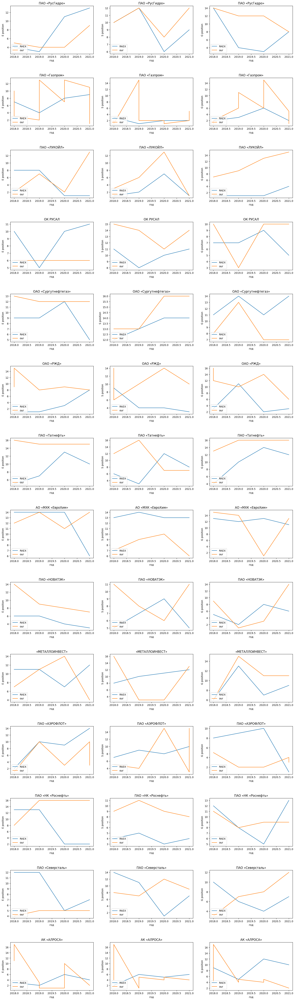

In [185]:
fig, axs = plt.subplots(14, 3, figsize=(20, 14*5))
plt.subplots_adjust(hspace=0.5)
for company_num, company in enumerate(companies_intersection):
    for label_num, label_ in enumerate(('E', 'S', 'G')):
        x1 = [2018, 2019, 2020, 2021]
        y1 = [raex_2018.loc[raex_2018['компания РСПП'] == company, label_].squeeze(),
              raex_2019.loc[raex_2019['компания РСПП'] == company, label_].squeeze(),
              raex_2020.loc[raex_2020['компания РСПП'] == company, label_].squeeze(),
              raex_2021.loc[raex_2021['компания РСПП'] == company, label_].squeeze()]
        x2 = df.loc[df['компания'] == company, 'год'].values
        y2 = df.loc[df['компания'] == company, label_].values

        axs[company_num, label_num].plot(x1, y1, label='RAEX')
        axs[company_num, label_num].plot(x2, y2, label='our')
        axs[company_num, label_num].legend(loc ='lower left')
        axs[company_num, label_num].set_xlabel('год')
        axs[company_num, label_num].set_ylabel(f'{label_} position')
        axs[company_num, label_num].set_title(company)
plt.show()